In [1]:
import networkx as nx
import numpy as np
import random
import math as mt

In [2]:
G = nx.read_edgelist('edge_list.txt')

In [3]:
threshold = 0.18

In [25]:
for node in G.nodes:
    G.nodes[node]['activated'] = 0
for node in G.nodes:
    G.nodes[node]['neighbors'] = len(list(G.neighbors(node)))
#     G.nodes[node]['activated_neighbors'] = sum([1 for n_ in G.neighbors(node) if G.nodes[n_]['activated']])
#     G.nodes[node]['neighbors_second_step_mean'] = sum([len(list(G.neighbors(n_))) for n_ in G.neighbors(node)]) / len(list(G.neighbors(node)))
#     G.nodes[node]['neighbors_activations_needed'] = [round(threshold * len(list(G.neighbors(n_))), 2) for n_ in G.neighbors(node)]

***Обновление графа***

In [40]:
# Graph activation update function
def update_graph(G, threshold, iterations):
    colors_old = []
    for _ in range(iterations):
        for node in G.nodes:
            if np.mean([1 if G.nodes[n_]['activated'] else 0 for n_ in G.neighbors(node)]) >= threshold:
                G.nodes[node]['activated'] = 1
        count_activated(G)
        color = []
        for node in G:
            if G.nodes[node]['activated']:
                color.append(1)
            else:
                color.append(0) 
        if sum(colors_old) == sum(color):
            return G
        colors_old = color
#         plt.figure(figsize=(15,15))
#         nx.draw(G, with_labels=True, node_color=color)
#         plt.show()
    return G

def count_activated(G):
    activated_sum = 0
    for node in G.nodes:
        if G.nodes[node]['activated']:
            activated_sum += 1
#     print(activated_sum)
    return activated_sum

***Количество вершин в компонентах связности***

In [6]:
sorted(list(map(len, nx.connected_components(G))))

[2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 4, 6, 9, 180, 3732]

*Как видно, у нас только две большие компоненты, которые стоит рассматривать*

*Первая попытка была составить все комбинации вершин, сумма степеней которых достаточно мала для того, чтобы вывести нас в плюс. Этот метод не был успешным из-за того, что таких компбинаций слишком много. Но для меньшей компоненты позволили увидеть, что её использование также не принесет пользы и можно её исключить оставив только главную компоненту.*

In [254]:
def get_recursive_combinations(nodes_li, count, combinations, combination, tt):
    for node in nodes_li:
        tmp = combination + [node]
        ostatok = count - small_subg.degree[node]
        combinations.append(tmp.copy())
        
        new_node_li = []
        for node_, deg in dict(small_subg.degree).items():
            if deg <= ostatok and deg > 0 and node_ > max(tmp):
                new_node_li.append(node_)
        tt += 1
        if len(new_node_li):
            combinations, tt = get_recursive_combinations(new_node_li, ostatok, combinations, tmp, tt)
    return combinations, tt
    
combinations_good, tt = get_recursive_combinations(nodes_li_big, 26, [], [], 0)
        

In [223]:
len(combinations_good)

1427786

In [234]:
# Для каждой комбинации считаем результаты
for sample_ex in combinations_good:
    small_subg_ = small_subg.copy()
    countt = 0
    for node in sample_ex:
        countt += G.nodes[node]['neighbors']
        small_subg_.nodes[node]['activated'] = 1
    small_subg_updated = update_graph(small_subg_.copy(), threshold, 8)
    color = []
    for node in small_subg_updated:
        if small_subg_updated.nodes[node]['activated']:
            color.append(1)
        else:
            color.append(0) 
    if sum(color) > 60:
        print(countt, sum(color), sample_ex)

***Теперь перейдем к главной компоненте***

In [28]:
for it in nx.connected_components(G):
    big_list = list(it)
    break
big_subg = G.subgraph(big_list).copy()

In [29]:
from collections import Counter
print("Степени вершин главной компоненты")
Counter(sorted(dict(big_subg.degree).values()))

Степени вершин главной компоненты


Counter({1: 72,
         2: 87,
         3: 85,
         4: 84,
         5: 90,
         6: 90,
         7: 98,
         8: 90,
         9: 89,
         10: 79,
         11: 72,
         12: 70,
         13: 77,
         14: 98,
         15: 78,
         16: 74,
         17: 65,
         18: 71,
         19: 58,
         20: 49,
         21: 62,
         22: 52,
         23: 57,
         24: 53,
         25: 53,
         26: 46,
         27: 36,
         28: 33,
         29: 36,
         30: 37,
         31: 45,
         32: 35,
         33: 39,
         34: 37,
         35: 39,
         36: 39,
         37: 41,
         38: 28,
         39: 25,
         40: 28,
         41: 21,
         42: 27,
         43: 20,
         44: 18,
         45: 23,
         46: 25,
         47: 22,
         48: 34,
         49: 24,
         50: 20,
         51: 18,
         52: 14,
         53: 22,
         54: 22,
         55: 18,
         56: 21,
         57: 14,
         58: 11,
         59: 18,
      

# Основные идеи

**1. Так как возможных комбинаций вершин экспоненциально много, попробуем находить наиболее оптимальную следующую вершину итеративно. В качестве функции выигрыша на первом шаге будем использовать соотношение количества доволнительно активированных вершин (на 20 шаге) за счета выбора данной вершины, к количеству соседей выбранной вершины (что пропорционально её стоимости). Фактически это производная денежного выигрыша за счет добавления данной вершины.
Пример: вершина Х активирует на 20 шаге 100 новых вершин, сама имея в соседях 5 вершин.**

**Тогда (300 * 50) / (300 * 5) = 10**

**Выбираем вершиину с наиболее быстрым денежным приростом**

**2. Также имеет смысл, особенно на более поздних шагах смотреть не только на производную, но и на общий денежный прирост. Это нужно для того, чтобы на каждом шаге не выбирать вершины степени 1. Теоретически можно сделать совместную функцию выигрыша от скорости прироста и абсолютного размера прироста, но я забил))**

**3. На финальном шаге, если хотите потюнить получишуюся модель, можно посмотреть, не раскладываются ли какие-либо из вершин как комбинация своих соседей ближайших порядком (1, 2, максимум 3). Вычислительно это не сложно, так как обычно большинство соседей выбранных вершин имеют степени больше самой вершины и их можно сразу не рассматривать. В итоге такие перестановки позволили мне дополнительно улучшить результата примерно на 4к$**

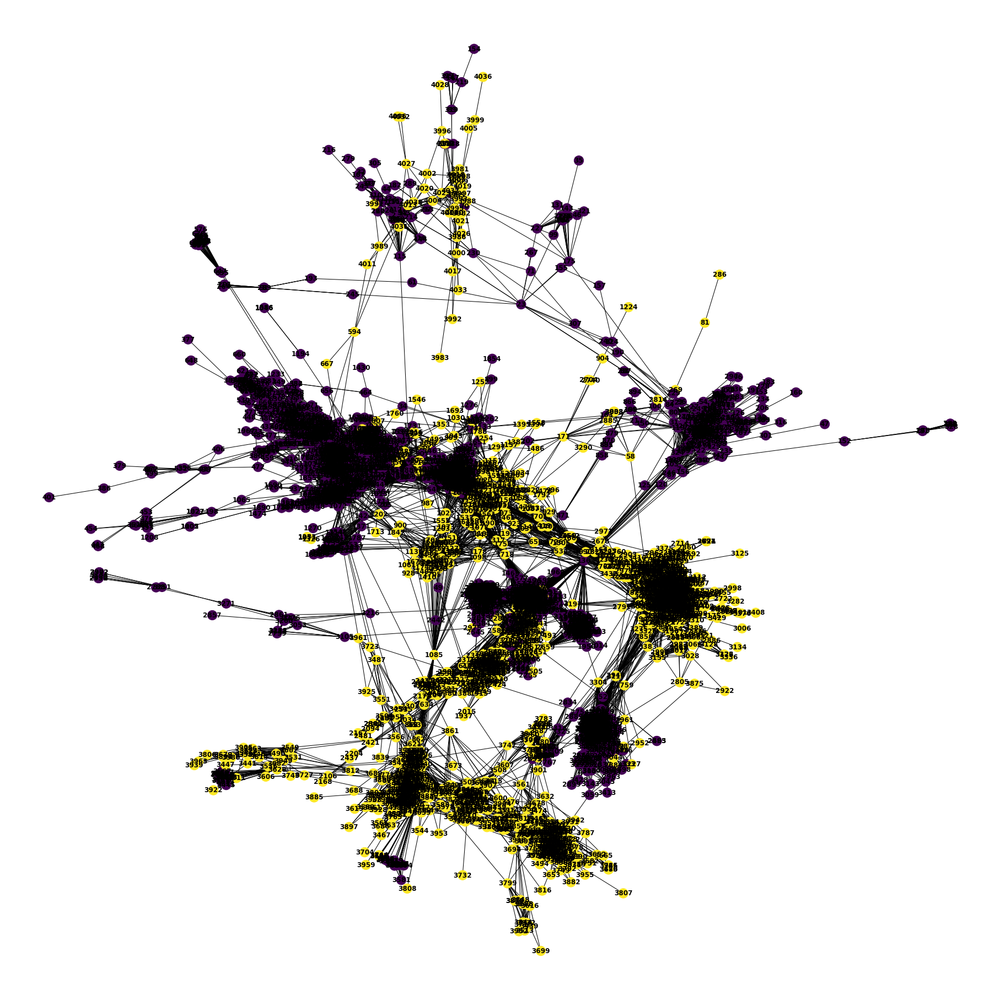

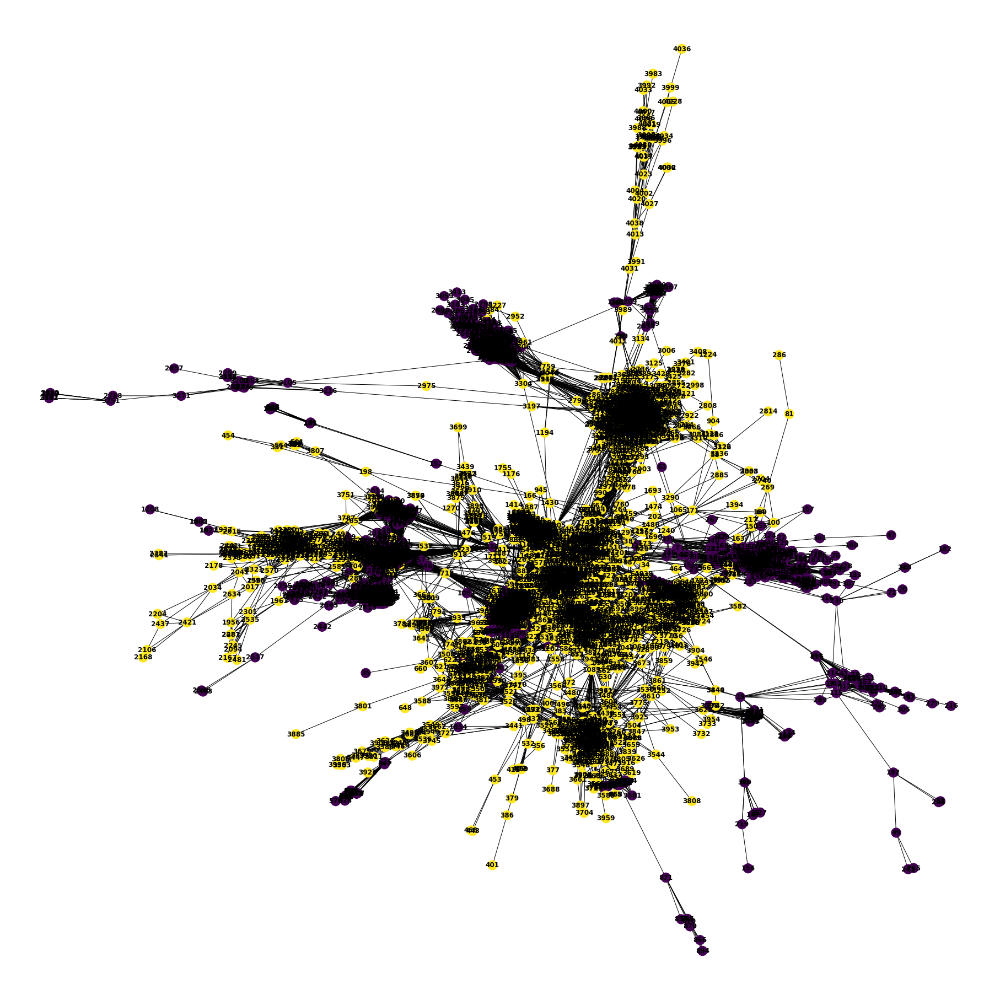

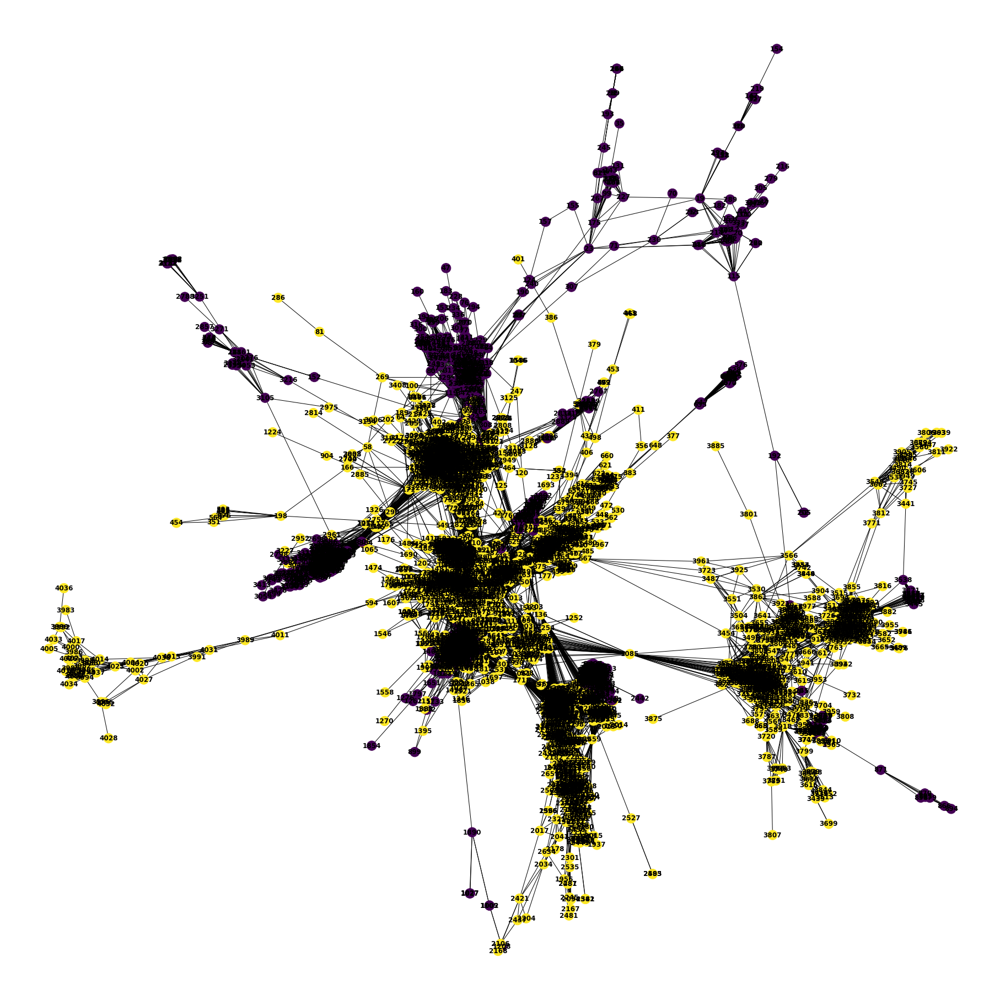

In [ ]:
deg_1 = []
data_deg = {}
for node, deg in dict(big_subg.degree).items():
    if node not in list_activated2:
        deg_1.append(['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1103', '1248', '2568', node])
        

for _, samp in enumerate(deg_1):
    big_subg_ = big_subg.copy()
    countt = 0
    for node in samp:
        countt += big_subg.nodes[node]['neighbors']
        big_subg_.nodes[node]['activated'] = 1
    big_subg_updated = update_graph(big_subg_.copy(), threshold, 20)
    sum_color = count_activated(big_subg_updated)
    if sum_color * 50 - countt * 300 > 108200:
        data_deg[samp[0]] = {
            'otn': sum_color * 50 / countt / 300,
            'count': countt,
            'col': sum_color
        }
        print(_)
        print(f"Номер вершины: {samp[-1]}, Скорость прироста: {round(sum_color * 50 / countt / 300, 3)}")
        print(f"Заработано денег с учетом этой вершины: {sum_color * 50 - countt * 300}")
        print(f"Суммарное количество соседей вершин, за которых мы заплатили: {countt}")
        print(f"Всего активировано вершин после 20 шагов: {sum_color}, Новый набор вершин: {samp}\n")

38
Номер вершины: 109, Скорость прироста: 4.812
Заработано денег с учетом этой вершины: 108650
Суммарное количество соседей вершин, за которых мы заплатили: 95
Всего активировано вершин после 20 шагов: 2743, Новый набор вершин: ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1103', '1248', '2568', '109']

142
Номер вершины: 7, Скорость прироста: 5.861
Заработано денег с учетом этой вершины: 113750
Суммарное количество соседей вершин, за которых мы заплатили: 78
Всего активировано вершин после 20 шагов: 2743, Новый набор вершин: ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1103', '1248', '2568', '7']

147
Номер вершины: 329, Скорость прироста: 5.152
Заработано денег с учетом этой вершины: 109600
Суммарное количество соседей вершин, за которых мы заплатили: 88
Всего активировано вершин после 20 шагов: 2720, Новый набор вершин: ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1103', '1248', '2568', '329']

151
Номер вершины: 54, Скор

In [482]:
samp = ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129']

big_subg_ = big_subg.copy()
countt = 0
for node in samp:
    countt += big_subg.nodes[node]['neighbors']
    big_subg_.nodes[node]['activated'] = 1
big_subg_updated = update_graph(big_subg_.copy(), threshold, 20)
sum_color = count_activated(big_subg_updated)
print(_, round(sum_color * 50 / countt / 300, 3), sum_color * 50 - countt * 300, countt, sum_color, samp)

1213 6.073 129350 85 3097 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129']


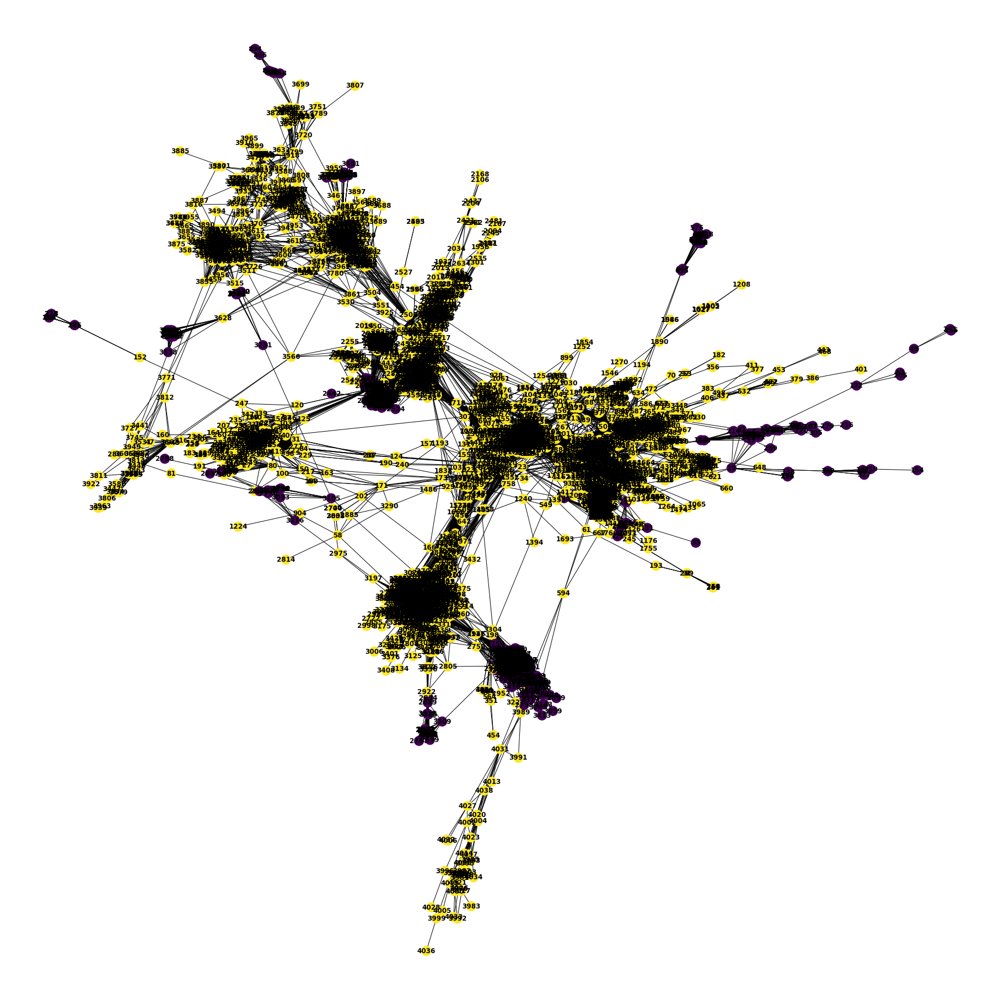

In [483]:
color = []
list_activated2 = []
for node in big_subg_updated:
    if big_subg_updated.nodes[node]['activated']:
        color.append(1)
        list_activated2.append(node)
    else:
        color.append(0) 
plt.figure(figsize=(25,25))
nx.draw(big_subg_updated, with_labels=True, node_color=color)
plt.show()

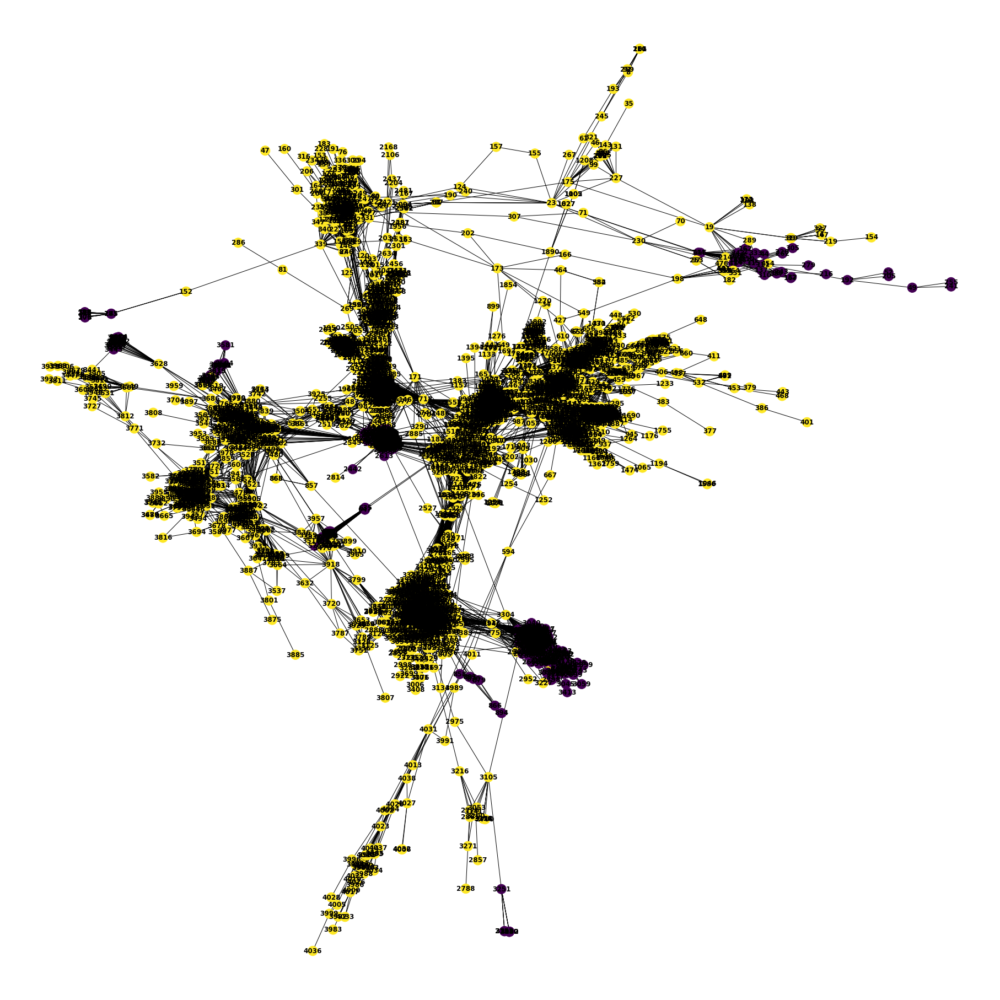

In [569]:
deg_1 = []
data_deg = {}
for node, deg in dict(big_subg.degree).items():
    if node not in list_activated2 and deg < 80:
        deg_1.append(['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129',
       '2788', '154', '138', node])
        
print(len(deg_1))
for _, samp in enumerate(deg_1):
    if _ % 100 == 0:
        print('!!!', _)
    big_subg_ = big_subg.copy()
    countt = 0
    for node in samp:
        countt += big_subg.nodes[node]['neighbors']
        big_subg_.nodes[node]['activated'] = 1
    big_subg_updated = update_graph(big_subg_.copy(), threshold, 20)
    sum_color = count_activated(big_subg_updated)
    if sum_color * 50 - countt * 300 > 130700:
        data_deg[samp[0]] = {
            'otn': sum_color * 50 / countt / 300,
            'count': countt,
            'col': sum_color
        }
        print(_, round(sum_color * 50 / countt / 300, 3), sum_color * 50 - countt * 300, countt, sum_color, samp)

348
!!! 0
29 5.824 131700 91 3180 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '2788', '154', '138', '262']
32 5.824 131700 91 3180 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '2788', '154', '138', '220']
39 5.638 130800 94 3180 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '2788', '154', '138', '167']
41 5.697 131050 93 3179 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '2788', '154', '138', '32']
!!! 100
151 4.636 130900 120 3338 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '2788', '154', '138', '2745']
!!! 200
!!! 300


In [610]:
samp = ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', 
        '154', '138', '3143', '3428']

big_subg_ = big_subg.copy()
countt = 0
for node in samp:
    countt += big_subg.nodes[node]['neighbors']
    big_subg_.nodes[node]['activated'] = 1
big_subg_updated = update_graph(big_subg_.copy(), threshold, 25)
sum_color = count_activated(big_subg_updated)
print(_, round(sum_color * 50 / countt / 300, 3), sum_color * 50 - countt * 300, countt, sum_color, samp)

347 5.771 138850 97 3359 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '154', '138', '3143', '3428']


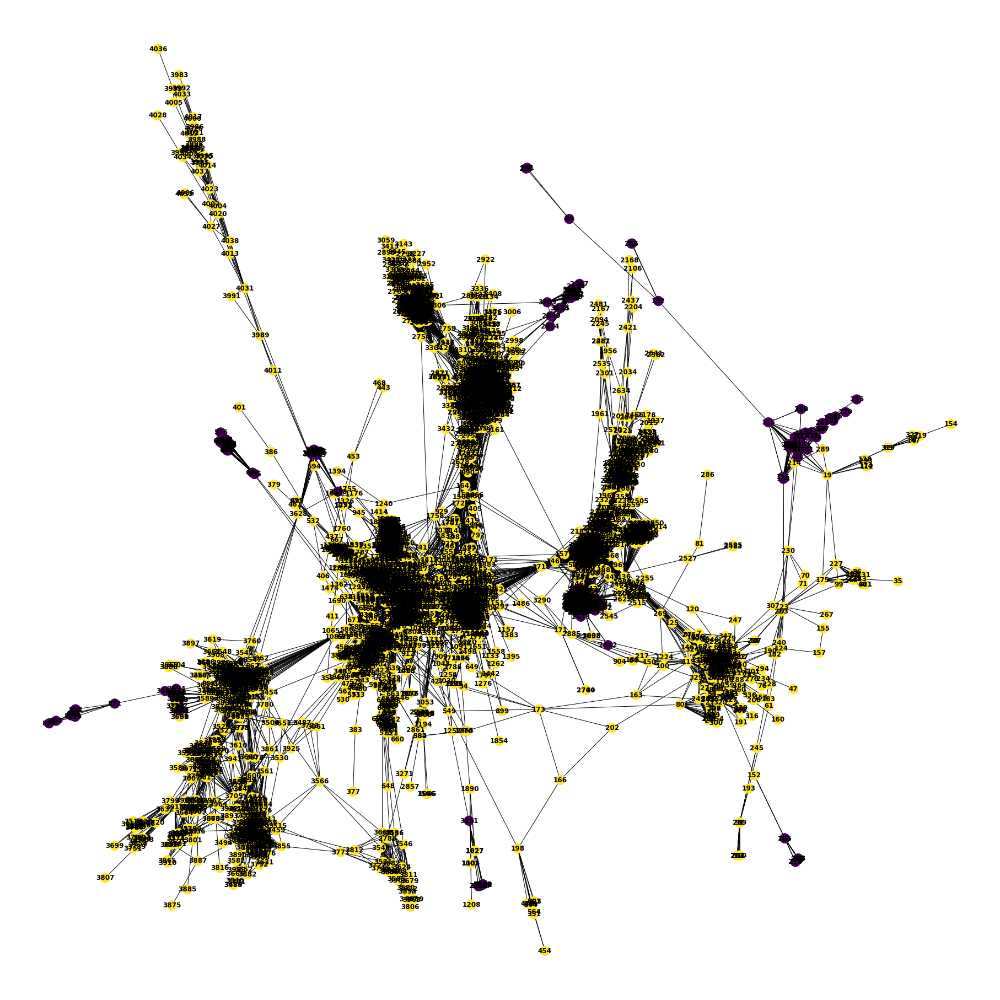

In [612]:
color = []
list_activated2 = []
for node in big_subg_updated:
    if big_subg_updated.nodes[node]['activated']:
        color.append(1)
        list_activated2.append(node)
    else:
        color.append(0) 
plt.figure(figsize=(25,25))
nx.draw(big_subg_updated, with_labels=True, node_color=color)
plt.show()

In [613]:
deg_1 = []
data_deg = {}
for node, deg in dict(big_subg.degree).items():
    if node not in list_activated2 and deg < 80:
        deg_1.append(['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', 
        '154', '138', '3143', '3428', node])
        
print(len(deg_1))
for _, samp in enumerate(deg_1):
    if _ % 100 == 0:
        print('!!!', _)
    big_subg_ = big_subg.copy()
    countt = 0
    for node in samp:
        countt += big_subg.nodes[node]['neighbors']
        big_subg_.nodes[node]['activated'] = 1
    big_subg_updated = update_graph(big_subg_.copy(), threshold, 30)
    sum_color = count_activated(big_subg_updated)
    if sum_color * 50 - countt * 300 > 138850:
        data_deg[samp[0]] = {
            'otn': sum_color * 50 / countt / 300,
            'count': countt,
            'col': sum_color
        }
        print(_, round(sum_color * 50 / countt / 300, 3), sum_color * 50 - countt * 300, countt, sum_color, samp)

174
!!! 0
29 5.662 139850 100 3397 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '154', '138', '3143', '3428', '262']
32 5.662 139850 100 3397 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '154', '138', '3143', '3428', '220']
39 5.497 138950 103 3397 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '154', '138', '3143', '3428', '167']
41 5.551 139250 102 3397 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '154', '138', '3143', '3428', '32']
!!! 100


In [658]:
samp = ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', 
        '154', '138', '3143', '3428', '220']

big_subg_ = big_subg.copy()
countt = 0
for node in samp:
    countt += big_subg.nodes[node]['neighbors']
    big_subg_.nodes[node]['activated'] = 1
big_subg_updated = update_graph(big_subg_.copy(), threshold, 25)
sum_color = count_activated(big_subg_updated)
print(_, round(sum_color * 50 / countt / 300, 3), sum_color * 50 - countt * 300, countt, sum_color, samp)

173 5.662 139850 100 3397 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', '154', '138', '3143', '3428', '220']


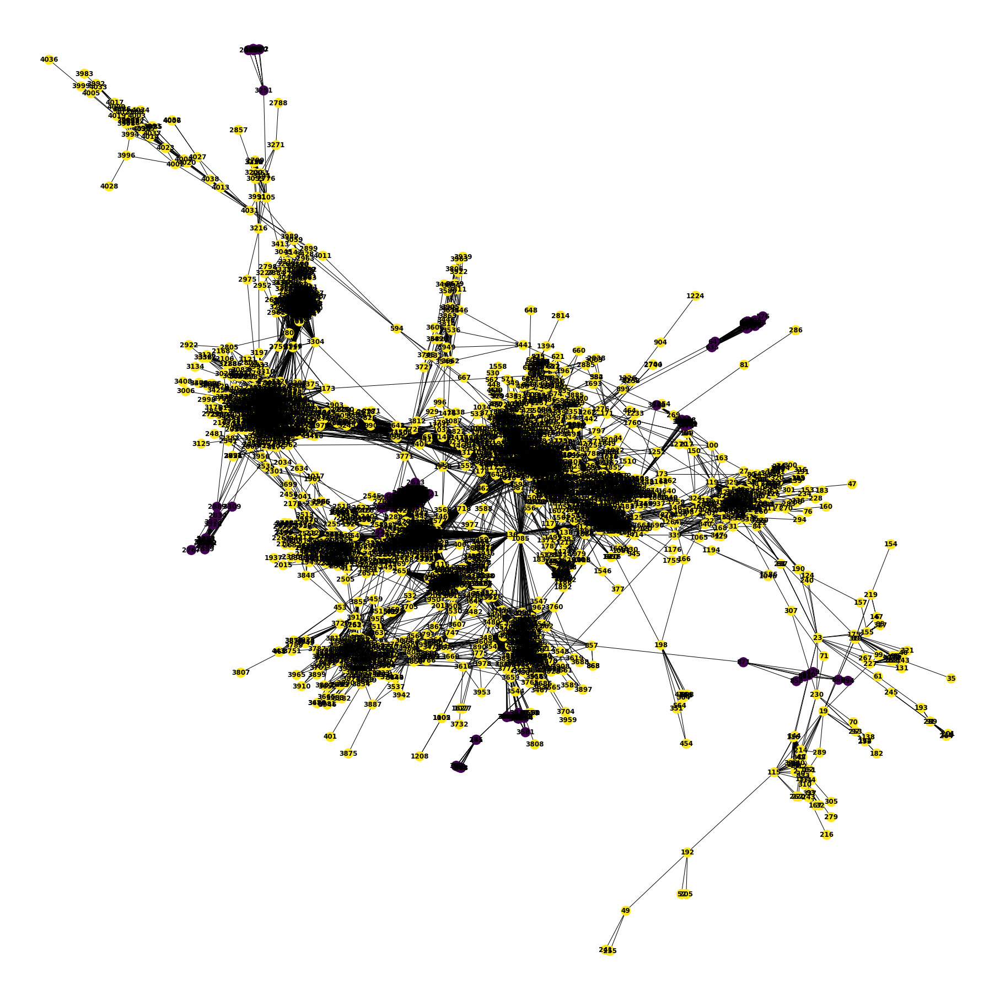

In [659]:
color = []
list_activated2 = []
for node in big_subg_updated:
    if big_subg_updated.nodes[node]['activated']:
        color.append(1)
        list_activated2.append(node)
    else:
        color.append(0) 
plt.figure(figsize=(25,25))
nx.draw(big_subg_updated, with_labels=True, node_color=color)
plt.show()

In [661]:
deg_1 = []
data_deg = {}
for node, deg in dict(big_subg.degree).items():
    if node not in list_activated2 and deg < 15:
        deg_1.append(['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', 
        '154', '138', '3143', '3428', '220', node])
        
print(len(deg_1))
for _, samp in enumerate(deg_1):
    if _ % 100 == 0:
        print('!!!', _)
    big_subg_ = big_subg.copy()
    countt = 0
    for node in samp:
        countt += big_subg.nodes[node]['neighbors']
        big_subg_.nodes[node]['activated'] = 1
    big_subg_updated = update_graph(big_subg_.copy(), threshold, 30)
    sum_color = count_activated(big_subg_updated)
    if sum_color * 50 - countt * 300 > 139850:
        data_deg[samp[0]] = {
            'otn': sum_color * 50 / countt / 300,
            'count': countt,
            'col': sum_color
        }
        print(_, round(sum_color * 50 / countt / 300, 3), sum_color * 50 - countt * 300, countt, sum_color, samp)

67
!!! 0


In [670]:
final_sample = ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129', 
        '154', '138', '3143', '3428', '220']

for i in range(1, len(final_sample)+1):
    summ = 0
    for j in final_sample[0:i]:
        summ += G.nodes[j]['neighbors']
    big_subg_ = big_subg.copy()
    for node in final_sample[0:i]:
        big_subg_.nodes[node]['activated'] = 1
    big_subg_updated = update_graph(big_subg_.copy(), threshold, 10)
    sum_color = count_activated(big_subg_updated)
    print(final_sample[0:i], summ*300, sum_color*50)

['2678'] 2400 50
['2678', '3432'] 3900 14500
['2678', '3432', '3808'] 4200 14600
['2678', '3432', '3808', '3953'] 5100 17500
['2678', '3432', '3808', '3953', '2263'] 6900 27650
['2678', '3432', '3808', '3953', '2263', '1474'] 7800 27700
['2678', '3432', '3808', '3953', '2263', '1474', '1759'] 9300 28100
['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264'] 10500 28200
['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248'] 12600 28450
['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103'] 14700 57500
['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568'] 17700 57550
['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084'] 21900 57650
['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347'] 23700 57700
['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1248', '1103', '2568', '1084', '347', '129'] 255

In [ ]:
{
    0: ['2678', '3432', '3808', '3953', '2263', '1474', '1759'],
    10: ['1264', '1248', '1103', '2568', '1084', '347', '129', '154', '138', '3143'],
    11: ['3428', '220']
}

In [705]:
big_subg_ = big_subg.copy()
for node in ['2678', '3432', '3808', '3953', '2263', '1474', '1759']:
    big_subg_.nodes[node]['activated'] = 1
big_subg_updated = update_graph(big_subg_.copy(), threshold, 1)
for node in big_subg_updated.nodes:
    if G.nodes[node]['activated'] == 1:
        print(node)
sum_color = count_activated(big_subg_updated)

2760 [0, 0, 0, 0, 0, 0, 0, 0, 1, 1]
!!! 2678
1840 [0, 0, 0, 0, 0, 0, 1, 0, 1]
!!! 1759
1759 [0, 0, 0, 0, 1]
!!! 1474
1474 [0, 0, 1]
3057 [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]
!!! 3432
3432 [0, 1, 1, 0, 0]
2621 [0, 0, 0, 1, 0]
!!! 2263
2431 [0, 0, 1, 0]
2528 [0, 0, 1, 0, 1, 1]
!!! 3953
3544 [0, 0, 1, 0]
!!! 3808
3808 [1]
2760 1
2678 1
1840 1
1759 1
1474 1
3057 1
3432 1
2621 1
2263 1
2431 1
2528 1
3953 1
3544 1
3808 1
14
2760 1
2678 1
1840 1
1759 1
1474 1
3057 1
3432 1
2621 1
2263 1
2431 1
2528 1
3953 1
3544 1
3808 1
14


In [683]:
print(G.nodes['3808']['neighbors'])

5


In [690]:
print(G.nodes['1474']['neighbors'] * threshold)
for nn in list(nx.neighbors(G, '1474')):
    print(nn, G.nodes[nn]['neighbors'], big_subg_updated.nodes[nn]['activated'])

0.54
1134 10 0
1000 15 0
1840 9 1


In [686]:
print(G.nodes['3544']['neighbors'] * threshold)
for nn in list(nx.neighbors(G, '3544')):
    print(nn, G.nodes[nn]['neighbors'], big_subg_updated.nodes[nn]['activated'])
# '3808', '3953'
# '3991'
# '1474' + '1759' активируют '1840'
# '206'

0.72
3775 8 1
3674 37 1
3808 1 1
3888 9 1


In [652]:
print(G.nodes['111']['neighbors'] * threshold)
for nn in list(nx.neighbors(G, '111')):
    print(nn, G.nodes[nn]['neighbors'], big_subg_updated.nodes[nn]['activated'])

2.34
312 25 0
214 16 1
20 14 0
17 12 0
326 18 0
137 15 0
343 17 0
279 1 0
337 8 0
310 12 0
44 5 0
41 23 0
93 7 0


In [650]:
for nn in list(nx.neighbors(G, '149')):
    print(nn, G.nodes[nn]['neighbors'], big_subg_updated.nodes[nn]['activated'])

116 16 0
28 12 0
312 25 0
20 14 0
333 7 0
144 14 0
226 13 0
343 17 0
326 18 0
162 7 0
115 20 0
2 9 0
14 14 0


In [651]:
for nn in list(nx.neighbors(G, '2')):
    print(nn, G.nodes[nn]['neighbors'], big_subg_updated.nodes[nn]['activated'])

116 16 0
312 25 0
20 14 0
333 7 0
226 13 0
149 13 0
326 18 0
343 17 0
115 20 0


In [631]:
for nn in list(nx.neighbors(G, '243')):
    print(nn, G.nodes[nn]['neighbors'], big_subg_updated.nodes[nn]['activated'])

312 25 0
137 15 0
310 12 0
41 23 0
216 1 0
167 6 0
337 8 0


In [632]:
for nn in list(nx.neighbors(G, '167')):
    print(nn, G.nodes[nn]['neighbors'], big_subg_updated.nodes[nn]['activated'])

137 15 0
310 12 0
32 5 0
243 7 0
93 7 0
337 8 0


In [331]:
samp = ['2678', '3432', '3808', '3953', '2263', '3991', '1474', '1759', '1264', '1103', '1248', '2568']
samp = ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1103', '1248', '2568'] #3991

big_subg_ = big_subg.copy()
countt = 0
for node in samp:
    countt += big_subg.nodes[node]['neighbors']
    big_subg_.nodes[node]['activated'] = 1
big_subg_updated = update_graph(big_subg_.copy(), threshold, 20)
sum_color = count_activated(big_subg_updated)
print(_, round(sum_color * 50 / countt / 300, 3), sum_color * 50 - countt * 300, countt, sum_color, samp)

1512 7.113 108200 59 2518 ['2678', '3432', '3808', '3953', '2263', '1474', '1759', '1264', '1103', '1248', '2568']


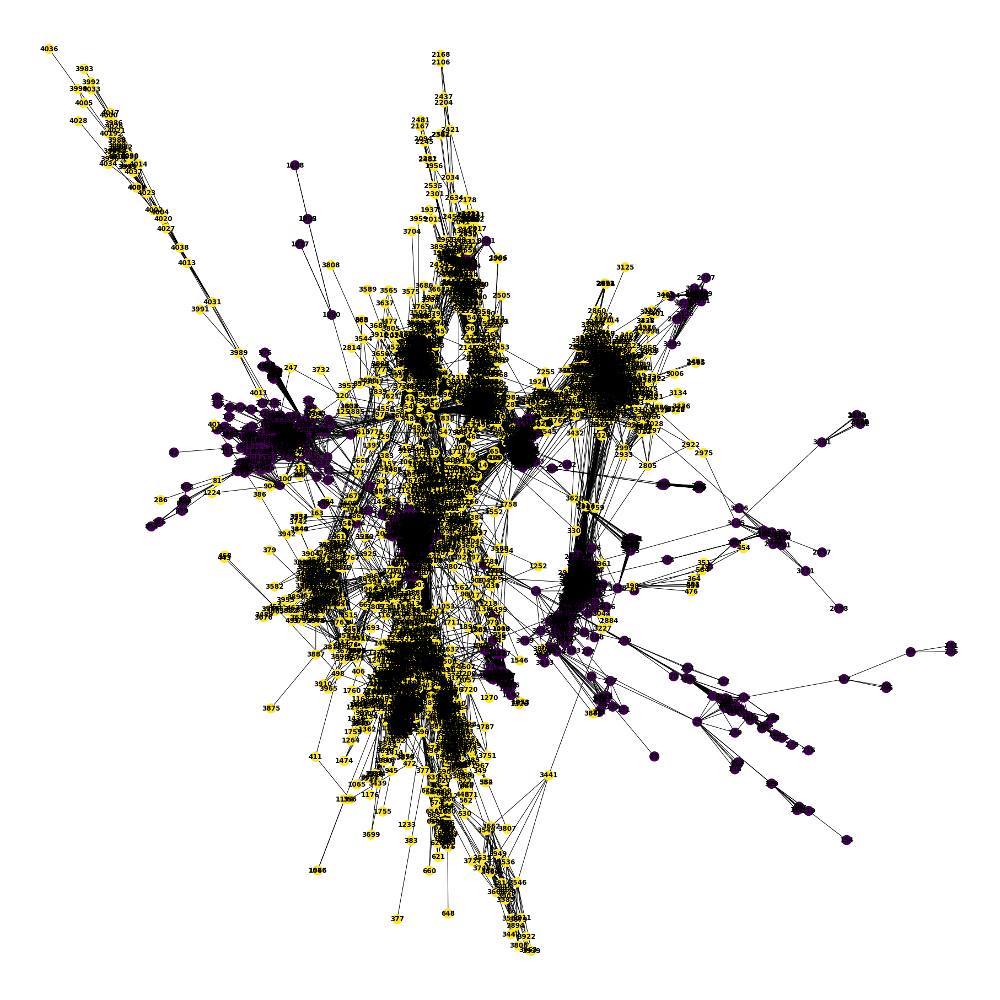

In [332]:
color = []
list_activated2 = []
for node in big_subg_updated:
    if big_subg_updated.nodes[node]['activated']:
        color.append(1)
        list_activated2.append(node)
    else:
        color.append(0) 
plt.figure(figsize=(25,25))
nx.draw(big_subg_updated, with_labels=True, node_color=color)
plt.show()